# Checking operator characteristics

In [1]:
# import external modules
import networkx as nx
import numpy as np
import scipy

# import custom modules for linking number identification
import intertwined.sampling as itws
import intertwined.edgePriority as itwe
import kirchhoff.circuit_dual as kcd
# import local module to create entangled toy models
import intertwined.tangledGenerators as tg
# import layoutPlots
import span.load_liver_networks as lln
lln.recalc_sets = False
lln.rad =0.08

In [2]:
def test_rotation():
    
    file_tags=['CD13','Basal']
   
    coarsed_data_sets = lln.coarsegrain_network_joint_datasets(file_tags)
    
    G0 = coarsed_data_sets[0][0]
    G1 = coarsed_data_sets[1][0]
    ref_sets = [G0, G1]
    
    for g in ref_sets:
        print(nx.info(g))
        print(itws.calc_nullity(g))
    
    g0 = coarsed_data_sets[0][1]
    g1 = coarsed_data_sets[1][1]
    graph_sets = [g0, g1]
    for g in graph_sets:
        print(nx.info(g))
        print(itws.calc_nullity(g))

    cyc_nx_base = [itws.calc_cycle_basis(G) for G in graph_sets]
    cyc_nx_base0 = itwe.reformat_basis(cyc_nx_base,ref_sets)
    
    c1 = cyc_nx_base[0][0]
    c01 = cyc_nx_base0[0][0]
    print(check_walk(c1,c01))

def check_walk(c1, c01):
    
    import intertwined.cycleToolsLinking as ctl
    T = ctl.linkedCycles_extraTools()
    
    cp1 = T.extract_path_origin(c1)
    ref = [*range(len(cp1))]
    cp01 = T.extract_path_origin(c01)
    print(ref)
    print(cp1)
    control=[]
    for p in cp01:
        for j, q in enumerate(cp1):
            if np.all(np.round(p,3) == np.round(q,3)):
                control.append(j)
                print(p)
    
    print(control)
    answer = ' '.join(map(str, ref)) in ' '.join(map(str, control * 2))
    return answer

test_rotation()

Looks like we've been here before, let's use the old stuff
Looks like we've been here before, let's use the old stuff
Looks like we've been here before, let's use the old stuff 
Looks like we've been here before, let's use the old stuff 
Name: 
Type: Graph
Number of nodes: 983
Number of edges: 1011
Average degree:   2.0570
29
Name: 
Type: Graph
Number of nodes: 188
Number of edges: 194
Average degree:   2.0638
7
Name: 
Type: Graph
Number of nodes: 76
Number of edges: 104
Average degree:   2.7368
29
Name: 
Type: Graph
Number of nodes: 15
Number of edges: 21
Average degree:   2.8000
7
[0, 1, 2, 3]
[array([1185.5     ,  728.5     ,  227.186111]), array([1183.244263,  729.244202,  223.430557]), array([1186.747192,  730.241821,  221.415939]), array([1192.5     ,  732.5     ,  223.173996])]
[1192.5       732.5       223.173996]
[1186.747192  730.241821  221.415939]
[1183.244263  729.244202  223.430557]
[1185.5       728.5       227.186111]
[3, 2, 1, 0]
False


In [3]:
from matplotlib import pyplot as plt
def screen_entaglementConsistency():
    
    file_tags=['CD13','Basal']
   
    coarsed_data_sets = lln.coarsegrain_network_joint_datasets(file_tags)
    
    G0 = coarsed_data_sets[0][0]
    G1 = coarsed_data_sets[1][0]
    ref_sets = [G0, G1]
    
    for g in ref_sets:
        print(nx.info(g))
        print(itws.calc_nullity(g))
    
    g0 = coarsed_data_sets[0][1]
    g1 = coarsed_data_sets[1][1]
    graph_sets = [g0, g1]
    for g in graph_sets:
        print(nx.info(g))
        print(itws.calc_nullity(g))

#     cyc_nx_base=[itws.calc_cycle_minimum_basis(G) for G in graph_sets]
    cyc_nx_base=[itws.calc_cycle_basis(G) for G in graph_sets]
    cyc_nx_base0=itwe.reformat_basis(cyc_nx_base,ref_sets)
    
    numeric_res= itws.calc_basis_linkage(*cyc_nx_base0)
    data = [np.round(v,3) for k,v in numeric_res.items()]
    
    fig, ax = plt.subplots()
    im = ax.hist(np.array(data), bins=50)
    ax.set_yscale('log')
    plt.show()
    
    fig.savefig('./test_fig.pdf')
    
def screen_entaglementConsistency2():

    file_tags=['CD13','Basal']
    coarsed_data_sets = lln.coarsegrain_network_joint_datasets(file_tags)

    G0 = coarsed_data_sets[0][0]
    G1 = coarsed_data_sets[1][0]
    ref_sets = [G0, G1]

    cyc_nx_base=[itws.calc_cycle_basis(G) for G in ref_sets]

    numeric_res= itws.calc_basis_linkage(*cyc_nx_base)
    data = [np.round(v,3) for k,v in numeric_res.items()]

    fig, ax = plt.subplots()
    im = ax.hist(np.array(data), bins=50)
    ax.set_yscale('log')
    plt.show()
#     fig.savefig('./test_figRef.pdf')

def cycleBasisConsistency():
    
    file_tags=['CD13','Basal']
    coarsed_data_sets = lln.coarsegrain_network_joint_datasets(file_tags)
    
    G0 = coarsed_data_sets[0][0]
    G1 = coarsed_data_sets[1][0]
    ref_sets = [G0, G1]
    
    P, L = [], []
    g0 = coarsed_data_sets[0][1]
    g1 = coarsed_data_sets[1][1]
    graph_sets = [g0, g1]
    
    cyc_nx_base=[itws.calc_cycle_basis(G) for G in graph_sets]
#     cyc_nx_base = [itws.calc_cycle_minimum_basis(G) for G in graph_sets]
    
    cyc_nx_base0 = itwe.reformat_basis(cyc_nx_base, ref_sets)
    
    return cyc_nx_base, cyc_nx_base0
    
cyc_nx_base, cyc_nx_base0 = cycleBasisConsistency() 

Looks like we've been here before, let's use the old stuff
Looks like we've been here before, let's use the old stuff
Looks like we've been here before, let's use the old stuff 
Looks like we've been here before, let's use the old stuff 


In [25]:
idx = 4
for i in range(len(cyc_nx_base[0])):
    if i == idx:
        c1 = cyc_nx_base[0][i]
        c2 = cyc_nx_base0[0][i]

        D = kcd.initialize_dual_circuit_from_networkx(c1,c2,[])
        fig = D.plot_circuit()
        fig.show()

circuit(): initialized and ready for (some) action :)
circuit(): initialized and ready for (some) action :)


In [5]:
# idx = 0
# idx2=6
# for i in range(len(cyc_nx_base[0])):
#     if i == idx:
#         c1 = cyc_nx_base[0][i]
#         c2 = cyc_nx_base[1][idx2]

#         D = kcd.initialize_dual_circuit_from_networkx(c1,c2,[])
#         fig = D.plot_circuit()
#         fig.show()

#         D = kcd.initialize_dual_circuit_from_networkx(cyc_nx_base0[0][i],cyc_nx_base0[1][idx2],[])
#         fig = D.plot_circuit()
#         fig.show()

In [6]:
# import intertwined.cycleToolsLinking as ctl
# T = ctl.linkedCycles_extraTools()

# c1 = cyc_nx_base[0][idx]
# c2 = cyc_nx_base[1][idx2]

# numeric_res1 = itws.calc_basis_linkage([c1],[c2])
# print(numeric_res1)
# for i in range(10):
#     numeric_res2 = itws.calc_basis_linkage([cyc_nx_base0[0][idx]],[cyc_nx_base0[1][idx2]])
#     print(numeric_res2)

Looks like we've been here before, let's use the old stuff
Looks like we've been here before, let's use the old stuff
Looks like we've been here before, let's use the old stuff 
Looks like we've been here before, let's use the old stuff 
Name: 
Type: Graph
Number of nodes: 983
Number of edges: 1011
Average degree:   2.0570
29
Name: 
Type: Graph
Number of nodes: 188
Number of edges: 194
Average degree:   2.0638
7
Name: 
Type: Graph
Number of nodes: 76
Number of edges: 104
Average degree:   2.7368
29
Name: 
Type: Graph
Number of nodes: 15
Number of edges: 21
Average degree:   2.8000
7


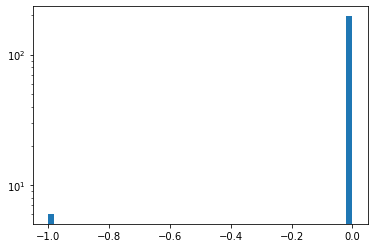

Looks like we've been here before, let's use the old stuff
Looks like we've been here before, let's use the old stuff
Looks like we've been here before, let's use the old stuff 
Looks like we've been here before, let's use the old stuff 
Name: 
Type: Graph
Number of nodes: 983
Number of edges: 1011
Average degree:   2.0570
29
Name: 
Type: Graph
Number of nodes: 188
Number of edges: 194
Average degree:   2.0638
7
Name: 
Type: Graph
Number of nodes: 76
Number of edges: 104
Average degree:   2.7368
29
Name: 
Type: Graph
Number of nodes: 15
Number of edges: 21
Average degree:   2.8000
7


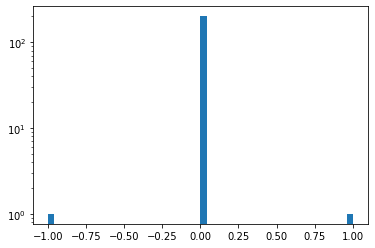

34.5 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [7]:
%%timeit -r 1
screen_entaglementConsistency()

In [8]:
# %%timeit -r 1
# screen_entaglementConsistency2()

In [32]:
def check_numeric_invariance(iteration):
    
    file_tags=['CD13','Basal']
    coarsed_data_sets = lln.coarsegrain_network_joint_datasets(file_tags)
    
    G0 = coarsed_data_sets[0][0]
    G1 = coarsed_data_sets[1][0]
    ref_sets = [G0, G1]
    
    P, L = [], []
    g0 = coarsed_data_sets[0][1]
    g1 = coarsed_data_sets[1][1]
    graph_sets = [g0, g1]
    
    for g in ref_sets:
        print(nx.info(g))
        print(itws.calc_nullity(g))

#     for i in range(iteration):
#         print(i)

#         cyc_nx_base=[itws.calc_cycle_basis(G) for G in ref_sets]
       
#         numeric_res = itws.calc_basis_linkage(*cyc_nx_base)
#         lk_mat = itws.extract_linkage_matrix(numeric_res)

#         graph_matrices = itws.get_basis_matrices(ref_sets, cyc_nx_base)
#         cyc_mat_dir = [cm for cm in graph_matrices[-2]]
        
       
#         cyc_mat_inv = [scipy.linalg.pinv(cm) for cm in cyc_mat_dir]

#         p = np.dot(np.dot(cyc_mat_inv[0].T, lk_mat), cyc_mat_inv[1])
#         P.append(p)
#     for i in range(iteration):
        
#         P, lk_mat = itwe.getEdgeLinkageOperator_liver(graph_sets, ref_sets)
#         mat_sets.append(P)

    for i in range(iteration):
        print(i)

        # cyc_nx_base = [itws.calc_cycle_minimum_basis(G) for G in graph_sets]
        cyc_nx_base=[itws.calc_cycle_basis(G) for G in graph_sets]
        cyc_nx_base0 = itwe.reformat_basis(cyc_nx_base, ref_sets)

        numeric_res = itws.calc_basis_linkage(*cyc_nx_base0)
        lk_mat = itws.extract_linkage_matrix(numeric_res)

        graph_matrices = itws.get_basis_matrices(graph_sets, cyc_nx_base)
        cyc_mat_dir = [cm for cm in graph_matrices[-2]]
#         print(len(cyc_mat_dir[0][0]))
#         print(len(cyc_mat_dir[1][0]))
#         for j in range(2):
#             k=0
#             for c1,c01 in zip(cyc_nx_base[j],cyc_nx_base0[j]):
#                 if not check_walk(c1,c01):
#                     cyc_mat_dir[j][:,k]*=(-1)
#                 k+=1
        
        cyc_mat_inv = [scipy.linalg.pinv(cm) for cm in cyc_mat_dir]

        p = np.dot(np.dot(cyc_mat_inv[0].T, lk_mat), cyc_mat_inv[1])
        P.append(p)
        
    return P

def diffMatrixSets(mat_sets):
    
    matSum = mat_sets[0]
    for ms in mat_sets[1:]:
        matSum = np.add(matSum,ms)    
    matSum = matSum/len(mat_sets)     
    
    matDiffSets = [np.subtract(ms,matSum) for ms in mat_sets]
    
    matDiff=[np.linalg.norm(mds) for mds in matDiffSets]
    diffMean = np.mean(matDiff)
    diffStd = np.std(matDiff)
        
    return diffMean, diffStd  

def diffMatrixSets2(mat_sets):
    
    matSum = np.absolute(mat_sets[0])
    for ms in mat_sets[1:]:
        matSum = np.add(matSum,np.absolute(ms))    
    matSum = matSum/len(mat_sets)     
    
    matDiffSets = [np.subtract(np.absolute(ms),matSum) for ms in mat_sets]
    
    matDiff=[np.linalg.norm(mds) for mds in matDiffSets]
    diffMean = np.mean(matDiff)
    diffStd = np.std(matDiff)
        
    return diffMean, diffStd  

In [33]:
# test dual
mat_sets = check_numeric_invariance(10)
diffMatrixSets(mat_sets)

Looks like we've been here before, let's use the old stuff
Looks like we've been here before, let's use the old stuff
Looks like we've been here before, let's use the old stuff 
Looks like we've been here before, let's use the old stuff 
Name: 
Type: Graph
Number of nodes: 983
Number of edges: 1011
Average degree:   2.0570
29
Name: 
Type: Graph
Number of nodes: 188
Number of edges: 194
Average degree:   2.0638
7
0
1
2
3
4
5
6
7
8
9


(0.38598785129319596, 0.2112577783727429)

In [21]:
diffMatrixSets2(mat_sets)

(0.37362165085722504, 0.3660328173016981)

In [26]:
import os

def built_filePath(index):
    
    path_in = '/Users/kramer/Documents/phd/projects/insilico/output/cluster_linkage_project/eval/liver_networks/'
    file_path = path_in + index +'/data'
    files = [f for f in os.listdir(file_path) if 'test_' in f]
    P = [np.load(file_path+'/'+f) for f in files]
    
    return P, files

index = str(43574262)
P, files = built_filePath(index)
diffMatrixSets2(P)

(1.137592262305993, 0.41900173686866543)

In [27]:
index = str(43616973)
P, files = built_filePath(index)
diffMatrixSets2(P)

(5.684786795190228e-16, 9.860761315262648e-32)

In [28]:
index = str(43618189)
P, files = built_filePath(index)
diffMatrixSets2(P)

(3.872126271624826e-16, 8.856171746961589e-17)

In [29]:
index = str(43618240)
P, files = built_filePath(index)
diffMatrixSets2(P)

(1.2590822752396882, 0.4739640883062056)

In [30]:
index = str(43617666)
P, files = built_filePath(index)
diffMatrixSets2(P)

(1.2969199262990463, 0.5640134142966675)

In [31]:
index = str(43618816)
P, files = built_filePath(index)
print(diffMatrixSets2(P))

def built_filePath2(index):
    
    path_in = '/Users/kramer/Documents/phd/projects/insilico/output/cluster_linkage_project/eval/liver_networks/'
    file_path = path_in + index +'/data'
    files = [f for f in os.listdir(file_path) if 'testL_' in f]
    P = [np.load(file_path+'/'+f) for f in files]
    
    return P, files

L, files = built_filePath2(index)

(1.22114733632768, 0.4222734783189067)


In [17]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
fig = make_subplots(rows=len(P[:10]), cols=2)
maxima = []
for i, p in enumerate(P[:10]): 
    
    I1 = np.dot(p,p.T)
    I2 = np.dot(p.T,p)
    
    s1 = [s for s in scipy.linalg.eigvalsh(I1) if s >= 0.00000001]
    s2 = [s for s in scipy.linalg.eigvalsh(I2) if s >= 0.00000001]
    print(np.sum(np.diagonal(I1)))

    maxima.append(np.amax(I1))
   
    fig.add_trace(go.Heatmap(z=np.absolute(I1), coloraxis="coloraxis"), row=i+1, col=1)
    fig.add_trace(go.Heatmap(z=np.absolute(I2), coloraxis="coloraxis"), row=i+1, col=2)

fig.update_layout(
    coloraxis = {'colorscale':'plasma', 'cmin': 0., 'cmax': np.amax(maxima)},
    autosize=False,
    height=2000,
    width=500,
)
fig.show()

4.474996562117412
1.2106218230063437
3.3949069954858153
1.7701524314926949
1.727250635456028
1.0537728707328191
2.4478439159905623
5.215024918539989
0.7178903865838602
2.3277933317093065


In [18]:
fig = make_subplots(rows=len(P[:10]), cols=1)
maxima = []
for i, p in enumerate(L[:10]): 

    maxima.append(np.amax(p))
    fig.add_trace(go.Heatmap(z=np.absolute(p), coloraxis="coloraxis"), row=i+1, col=1)

fig.update_layout(
    coloraxis = {'colorscale':'plasma', 'cmin': 0., 'cmax': np.amax(maxima)},
    autosize=False,
    height=4000,
    width=500,
)
fig.show()